# Import

In [1]:
import os
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline
import matplotlib.pyplot as plt

2025-08-28 22:21:02.423550: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756419662.657459      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756419662.724511      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Functions

In [2]:
import requests
from PIL import Image, ImageOps
from io import BytesIO

def download_image(url, resize=False):
    # download and open the image
    image = Image.open(BytesIO(requests.get(url, stream=True).content))
    image = ImageOps.exif_transpose(image)
    image = image.convert("RGB")
    
    if resize:
        w, h = image.size
        if w > h:
            new_w = 512
            new_h = int(h * 512 / w)
        else:
            new_h = 512
            new_w = int(w * 512 / h)
        image = image.resize((new_w, new_h))
    
    return image


In [3]:
def generate_image(image,
                   prompt,
                  num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  ):
    # Set seed
    generator = torch.Generator("cuda").manual_seed(seed)
    # Generate image
    edited_image = pipe(
        prompt=prompt,
        image=image,
        num_inference_steps=num_inference_steps,
        image_guidance_scale=image_guidance_scale,
        guidance_scale=guidance_scale,
        generator=generator
    ).images[0]
    
    return edited_image

In [4]:
from PIL import Image, ImageOps

def plot_single_edit(original_image, edited_image, edit_prompt):
    fontsize = 12
    
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(original_image)
    axs[0].axis("off")
    axs[0].set_title("Original Image", fontsize=fontsize)
    
   
    # Mostra original & editato
    axs[1].imshow(edited_image)
    axs[1].axis("off")
    axs[1].set_title(f"\"{edit_prompt}\"", fontsize=fontsize)

    plt.tight_layout()
    plt.show()

In [5]:
def plot_multiple_edits(original_image, edited_images, edit_prompts, fontsize = 18):

    num_prompts = len(edit_prompts)
    fig, axs = plt.subplots(1, num_prompts + 1, figsize=(6*(num_prompts+1), 6))
    axs[0].imshow(original_image)
    axs[0].axis("off")
    axs[0].set_title("Original Image", fontsize=fontsize)
    
    for i in range(num_prompts):
      axs[i+1].imshow(edited_images[i])
      axs[i+1].axis("off")
      axs[i+1].set_title(f"\"{edit_prompts[i]}\"", fontsize=fontsize)
    
    plt.tight_layout()
    plt.show()

def plot_multiple_seeds(original_image, edited_images, seeds, edit_prompt="", fontsize=18, figsize=(24, 7)):

    num_prompts = len(seeds)
    fig, axs = plt.subplots(1, num_prompts + 1, figsize=figsize)
    axs[0].imshow(original_image)
    axs[0].axis("off")
    axs[0].set_title("Original Image", fontsize=fontsize)
    
    for i in range(num_prompts):
      # Mostra original & editato
      axs[i+1].imshow(edited_images[i])
      axs[i+1].axis("off")
      axs[i+1].set_title(f"Seed: {seeds[i]}", fontsize=fontsize)
   
    if edit_prompt:
        fig.suptitle(f"Edit prompt: \"{edit_prompt}\"", fontsize=fontsize+4)
         
    plt.tight_layout()
    plt.show()

# Model

In [6]:
pretrained_model_name_or_path = "iamlucaconti/instruct-pix2pix-model"
# Load model
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")


model_index.json:   0%|          | 0.00/703 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/735 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/374 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/830 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_instruct_pix2pix.StableDiffusionInstructPix2PixPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


# Single edit

  0%|          | 0/50 [00:00<?, ?it/s]

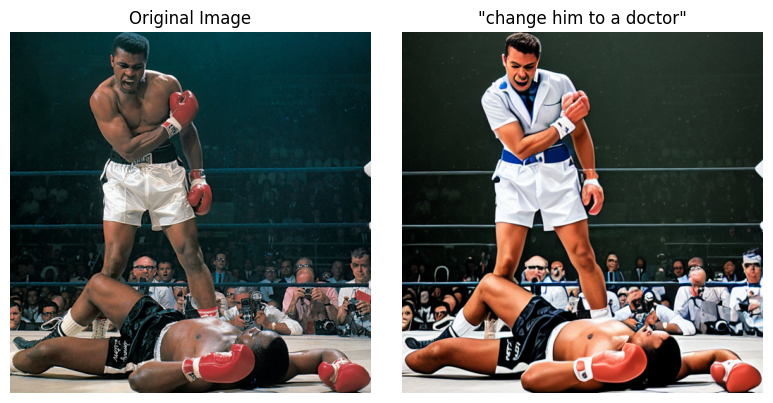

In [7]:
seed = 0
image_url = "https://i.guim.co.uk/img/media/7fa6a03e6a72421c0b2f40352ce1a423e6297974/0_539_3565_2140/master/3565.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=eb90596030fb4f3e6f9cd4efbdca3035"
prompt = "change him to a doctor"
num_inference_steps = 50
image_guidance_scale = 2
guidance_scale = 3

# Load image
image = download_image(image_url, True)

# Generate image
edited_image = generate_image(image,
                   prompt,
                  num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )

plot_single_edit(image, edited_image, prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

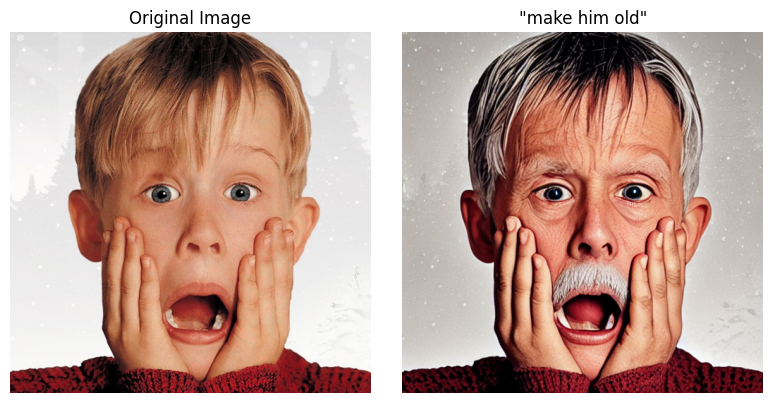

In [22]:
seed = 0
image_url = "https://cloud.rtl.it/RTLFM/News/Article/600x600/ecco-che-fine-hanno-fatto-i-bambini-di-mamma-ho-perso-l-aereo-7okdl.jpg"
prompt = "make him old"
num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 3

# Load image
image = download_image(image_url, True)

# Generate image
edited_image = generate_image(image,
                   prompt,
                  num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )

plot_single_edit(image, edited_image, prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

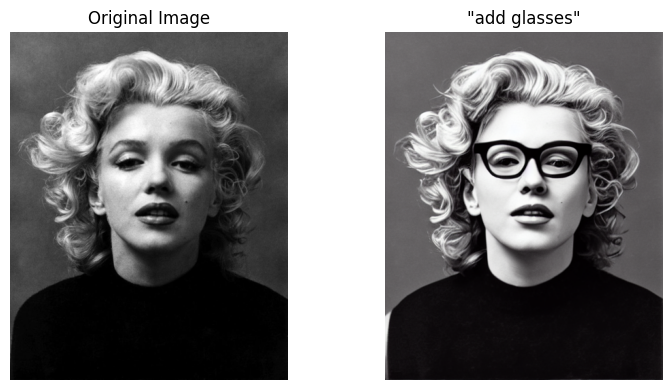

In [9]:
seed = 0
image_url = "https://i.pinimg.com/736x/81/2f/6c/812f6cc33da4478ee8e67b8973de431e.jpg"
prompt = "add glasses"
num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 3

# Load image
image = download_image(image_url, True)

# Generate image
edited_image = generate_image(image,
                   prompt,
                  num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )

plot_single_edit(image, edited_image, prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

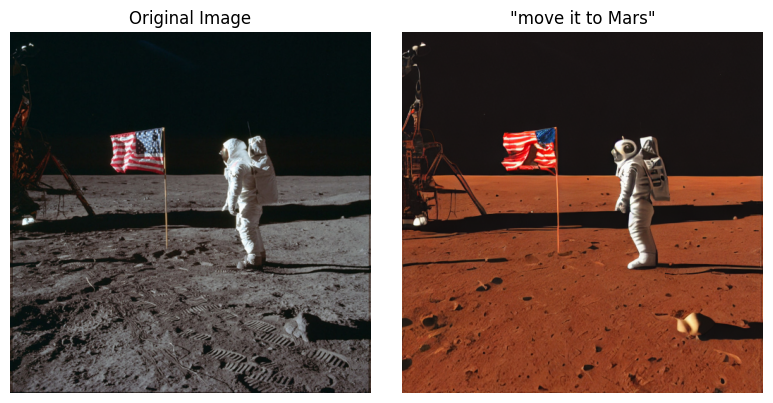

In [10]:
seed = 0
image_url = "https://www.cleveland.com/resizer/v2/https%3A%2F%2Fadvancelocal-adapter-image-uploads.s3.amazonaws.com%2Fexpo.advance.net%2Fimg%2F07c064ae2c%2Fwidth2048%2F468_05moon.jpeg?auth=1e1fc2580bcf318fe37095580987aa1d35485b352c49c6fd6fbebb9eb4ebc88d&width=1280&quality=90"
prompt = "move it to Mars"
num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 3

# Load image
image = download_image(image_url, True)

# Generate image
edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )

plot_single_edit(image, edited_image, prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

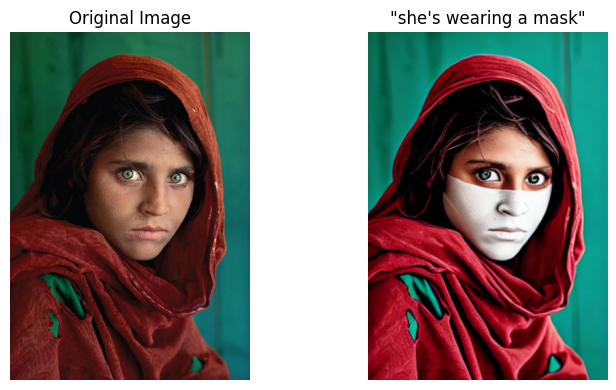

In [11]:
seed = 42
image_url = "https://www.iphotography.com/wp-content/uploads/2020/08/Worlds-15-Most-Iconic-Portraits-by-iPhotography.com-11.jpg"
prompt = "she's wearing a mask"
num_inference_steps = 50
image_guidance_scale = 3
guidance_scale = 2.5

# Load image
image = download_image(image_url, True)

# Generate image
edited_image = generate_image(image,
                   prompt,
                  num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )

plot_single_edit(image, edited_image, prompt)

# Multiple edits

## Different Prompts

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

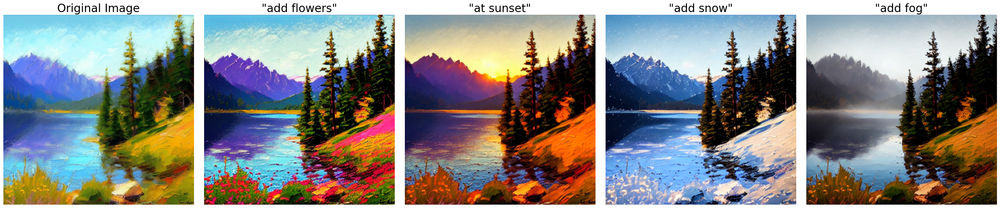

In [12]:
seed = 0
image_url = "https://huggingface.co/datasets/sayakpaul/sample-datasets/resolve/main/test_pix2pix_4.png"

prompts = ["add flowers",
           "at sunset",
           "add snow",
           "add fog"]

num_inference_steps = 100
image_guidance_scale = 2
guidance_scale = 4

# Load image
image = download_image(image_url, True)

edited_images = []
for prompt in prompts:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    
    edited_images.append(edited_image)

plot_multiple_edits(image, edited_images, prompts, fontsize = 24)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

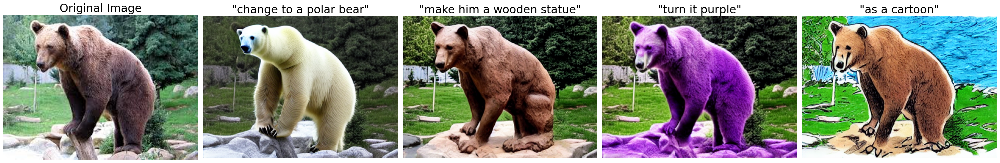

In [13]:
seed = 0
image_url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTZ-eo0-05BNn4XPA23qXwLCsvoypHEAORGyg&s"
prompts = ["change to a polar bear",
           "make him a wooden statue",
           "turn it purple",
            "as a cartoon"
          ]
    
        
num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 4

# Load image
image = download_image(image_url, True)

edited_images = []
for prompt in prompts:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    
    edited_images.append(edited_image)

plot_multiple_edits(image, edited_images, prompts, fontsize=24)

## Different seeds

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

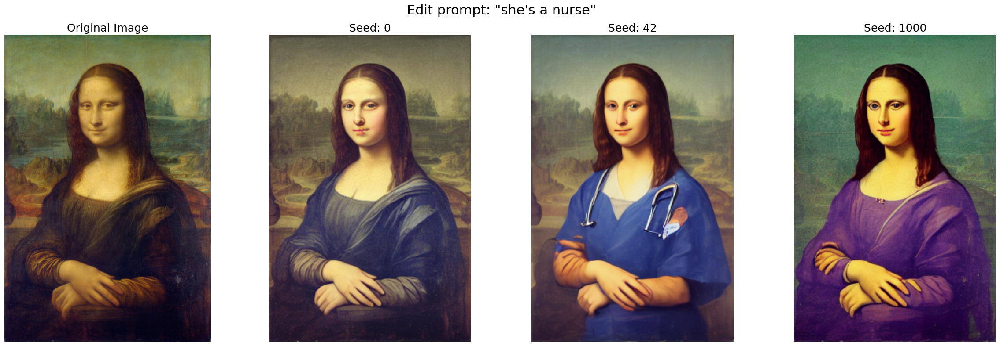

In [14]:
image_url = "https://www.analisidellopera.it/wp-content/uploads/2018/01/Leonardo_Monna_Lisa_Gioconda.jpg"
prompt = "she's a nurse"
seeds = [0, 42, 1000]

num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 2

# Load image
image = download_image(image_url, True)

edited_images = []

for seed in seeds:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    
    edited_images.append(edited_image)

plot_multiple_seeds(image, edited_images, seeds, prompt, figsize=(24, 8))

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

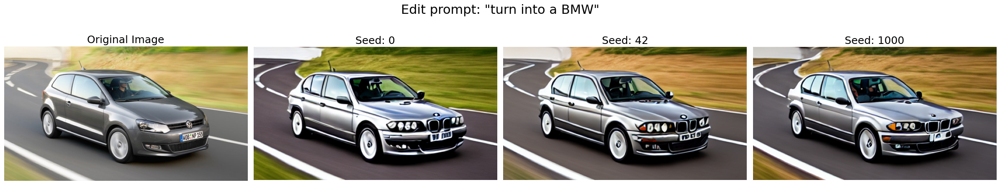

In [15]:
image_url = "https://car-images.bauersecure.com/wp-images/5340/vwpolo3door_1.jpg"
prompt = "turn into a BMW"
seeds = [0, 42, 1000]

num_inference_steps = 100
image_guidance_scale = 1.6
guidance_scale = 3

# Load image
image = download_image(image_url, True)

edited_images = []

for seed in seeds:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    
    edited_images.append(edited_image)


plot_multiple_seeds(image, edited_images, seeds, prompt, figsize=(24, 5))

## Concatenation

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

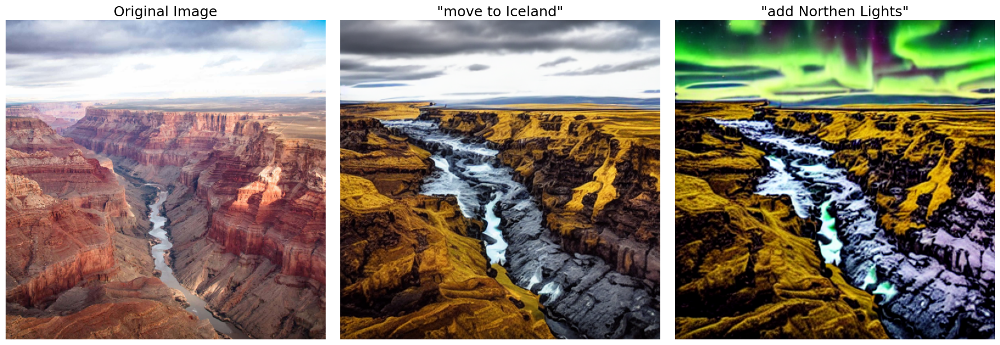

In [16]:
seed = 0
image_url = "https://cdn.ta-petro.com/media/nxqheb4n/road-trip-to-grand-canyon.jpg?width=1600&height=1600&rnd=133912132595530000"
prompts = ["move to Iceland", "add Northen Lights"]

num_inference_steps = 100
image_guidance_scale = 1.6
guidance_scale = 4

# Load the original image
image = download_image(image_url, True)

edited_images = []

input_image = image
for prompt in prompts:
    edited_image = generate_image(input_image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    edited_images.append(edited_image)
    input_image = edited_image


plot_multiple_edits(image, edited_images, prompts)

## $c_T$ and $c_I$ influence

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

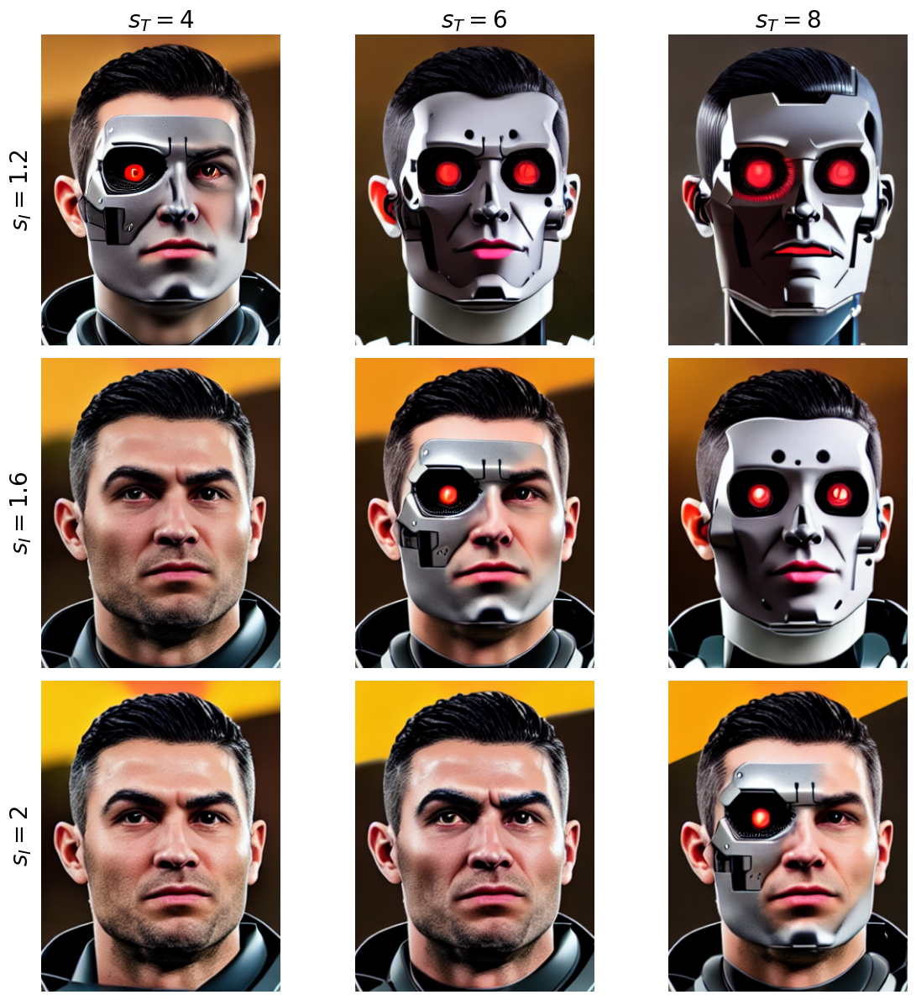

In [19]:
import torch
import matplotlib.pyplot as plt

seed = 0
image_url =  "https://img.a.transfermarkt.technology/portrait/big/8198-1748102259.jpg"
prompt = "turn into a cyborg"
num_inference_steps = 50
image_guidance_scales = [1.2, 1.6, 2]
guidance_scales = [4, 6, 8]

# Load the original image
image = download_image(image_url)

results = []

for img_scale in image_guidance_scales:
    row_results = []
    for txt_scale in guidance_scales:
        edited_image = generate_image(image,
               prompt,
               num_inference_steps,
               img_scale,
               txt_scale,
               seed
              )
        row_results.append((img_scale, txt_scale, edited_image))
    results.append(row_results)



fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for i, row in enumerate(results):
    for j, (img_scale, txt_scale, im) in enumerate(row):
        axes[i, j].imshow(im)
        axes[i, j].axis("off")

        # Column titles (only on the first row)
        if i == 0:
            axes[i, j].set_title(f"$s_{{T}}={txt_scale}$", fontsize=20)

plt.tight_layout()

# Now place the row labels outside the grid
for i, img_scale in enumerate(image_guidance_scales):
    ax = axes[i, 0]  # first axis of row i
    pos = ax.get_position()  # bounding box [x0, y0, x1, y1] in figure
    x = pos.x0 - 0.02        # a bit to the left of the grid
    y = (pos.y0 + pos.y1) / 2  # vertically centered on the row
    fig.text(x, y, f"$s_{{I}}={img_scale}$", va="center", ha="center", 
             fontsize=20, rotation=90)

plt.show()


## Bias

  0%|          | 0/50 [00:00<?, ?it/s]

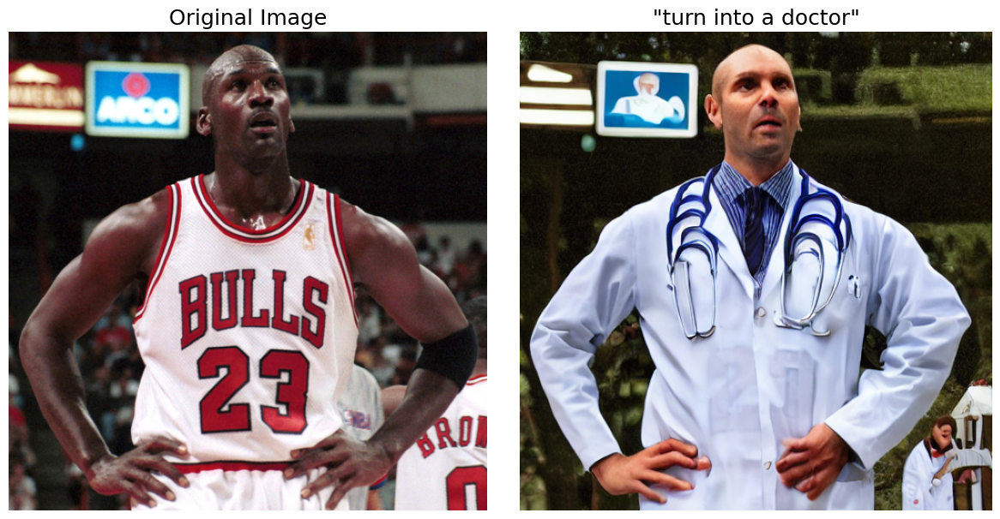

In [20]:
seed = 0
image_url = "https://www.usmagazine.com/wp-content/uploads/2023/04/michael-jordan-through-the-years-14.jpg?quality=70&strip=all"
prompts = ["turn into a doctor"]

num_inference_steps = 50
image_guidance_scale = 1.2
guidance_scale = 3

# Load image
image = download_image(image_url, True)

edited_images = []

for prompt in prompts:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    edited_images.append(edited_image)

plot_multiple_edits(image, edited_images, prompts)

  0%|          | 0/50 [00:00<?, ?it/s]

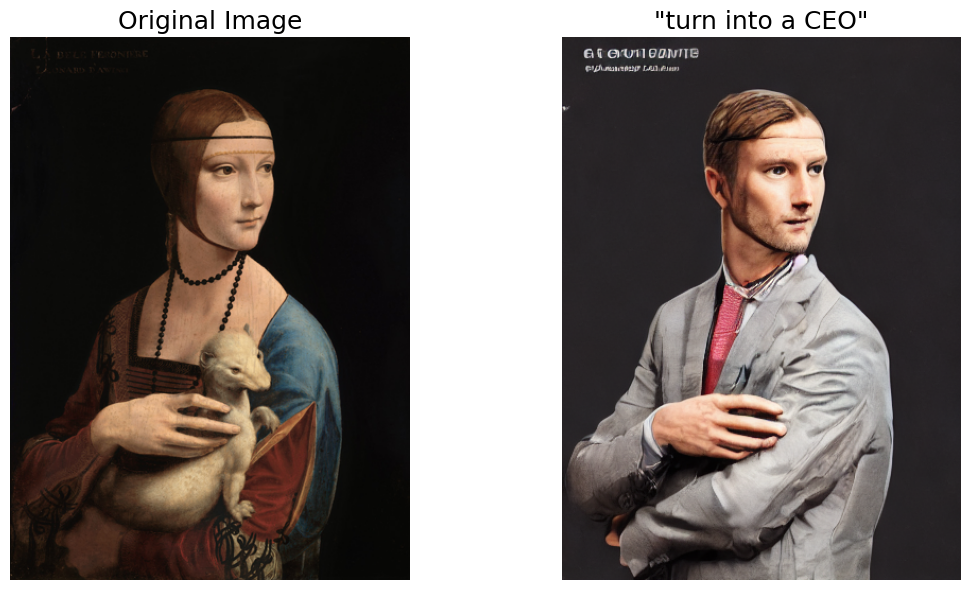

In [21]:
seed = 0
image_url = "https://www.copia-di-arte.com/kunst/leonardo_da_vinci/Die-Dame-mit-dem-Hermelin.jpg"
prompts = ["turn into a CEO"]

num_inference_steps = 50
image_guidance_scale = 1.6
guidance_scale = 3

# Load image
image = download_image(image_url, True)

edited_images = []

for prompt in prompts:
    edited_image = generate_image(image,
                   prompt,
                   num_inference_steps,
                   image_guidance_scale,
                   guidance_scale,
                   seed
                  )
    edited_images.append(edited_image)

plot_multiple_edits(image, edited_images, prompts)

# 